In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [4]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

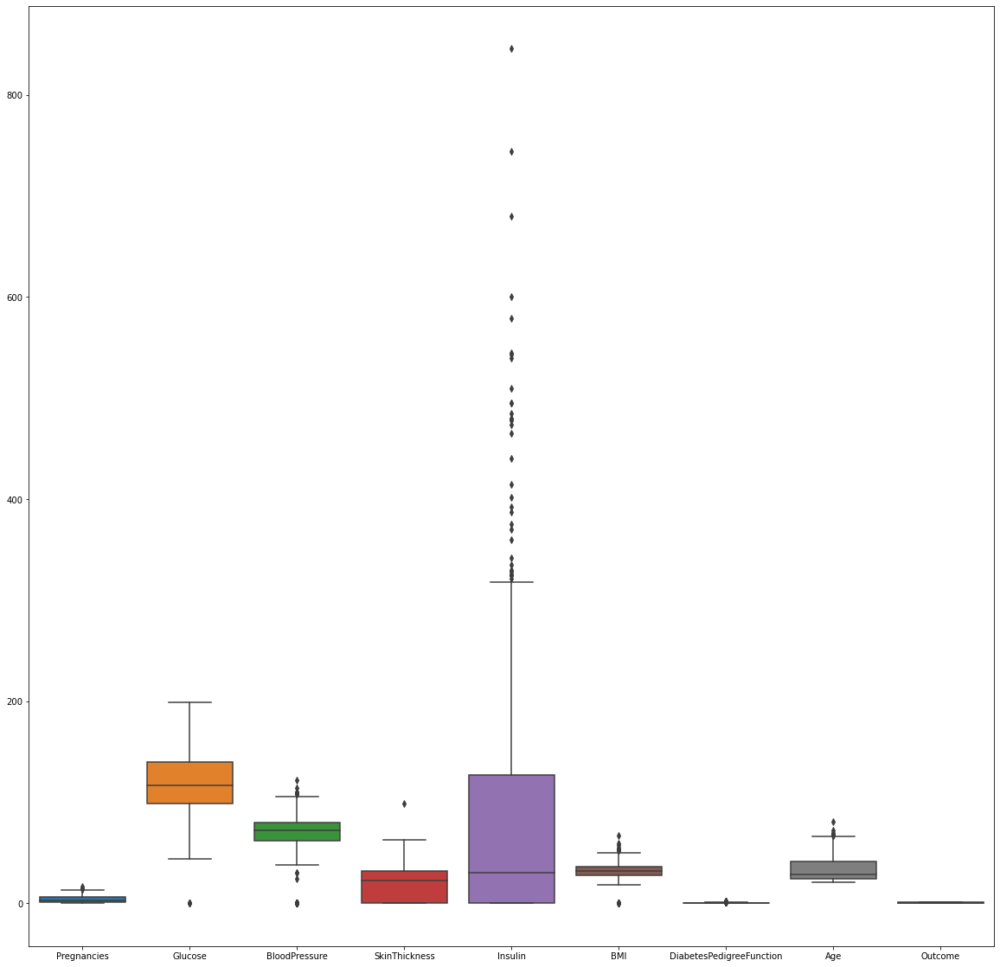

In [5]:
fig, ax= plt.subplots(figsize =(20,20))
sns.boxplot(data = df, ax=ax)

In [27]:
df1=df
df1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [28]:
lst=['Glucose','BloodPressure','SkinThickness','Insulin','BMI']
for i in lst:
    df1[i] = df1[i].replace(0,df1[i][df1[i]>0].mean())

In [33]:
ProfileReport(df1)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
df1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.00000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.00000,155.548223,36.8,0.340,27,0
765,5,121.0,72.0,23.00000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,29.15342,155.548223,30.1,0.349,47,1


<AxesSubplot:>

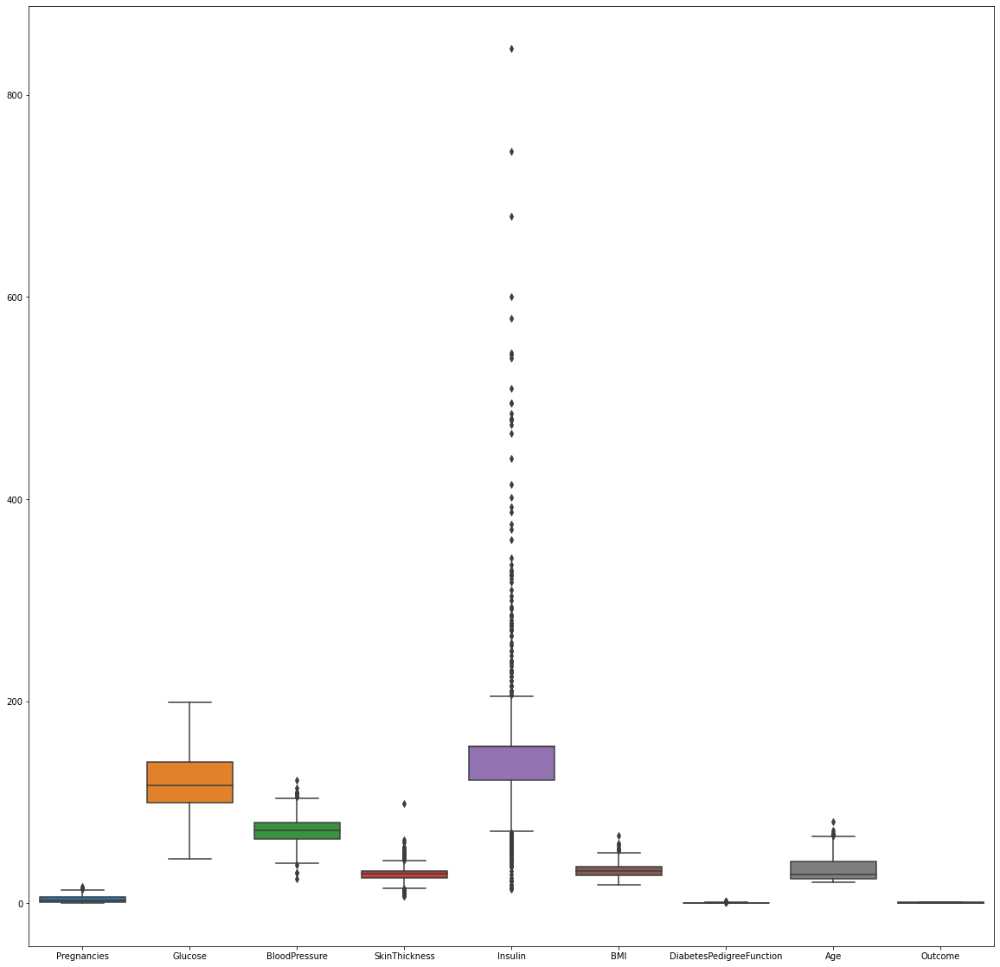

In [8]:
fig, ax= plt.subplots(figsize =(20,20))
sns.boxplot(data = df, ax=ax)

In [9]:
df2=df

In [10]:
df2

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.00000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.00000,155.548223,36.8,0.340,27,0
765,5,121.0,72.0,23.00000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,29.15342,155.548223,30.1,0.349,47,1


In [11]:
lst=['Glucose','BloodPressure','SkinThickness','Insulin','BMI']
for i in lst:
    df2[i] = df2[i].replace(0,df2[i].mean())

<AxesSubplot:>

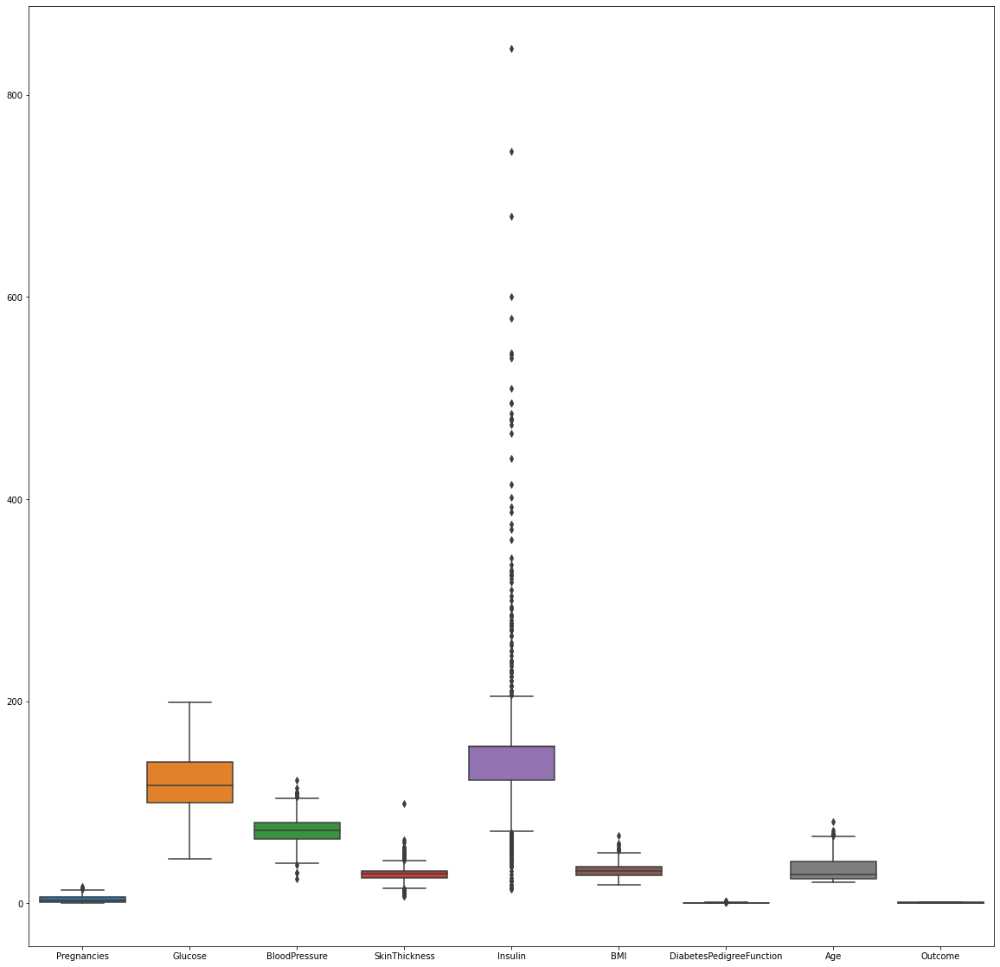

In [31]:
fig, ax= plt.subplots(figsize =(20,20))
sns.boxplot(data = df2, ax=ax)

In [30]:
q=df1['Insulin'].quantile(.90)
df_new1 = df1[df1['Insulin'] < q]       
df_new1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.00000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.00000,155.548223,36.8,0.340,27,0
765,5,121.0,72.0,23.00000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,29.15342,155.548223,30.1,0.349,47,1


<AxesSubplot:>

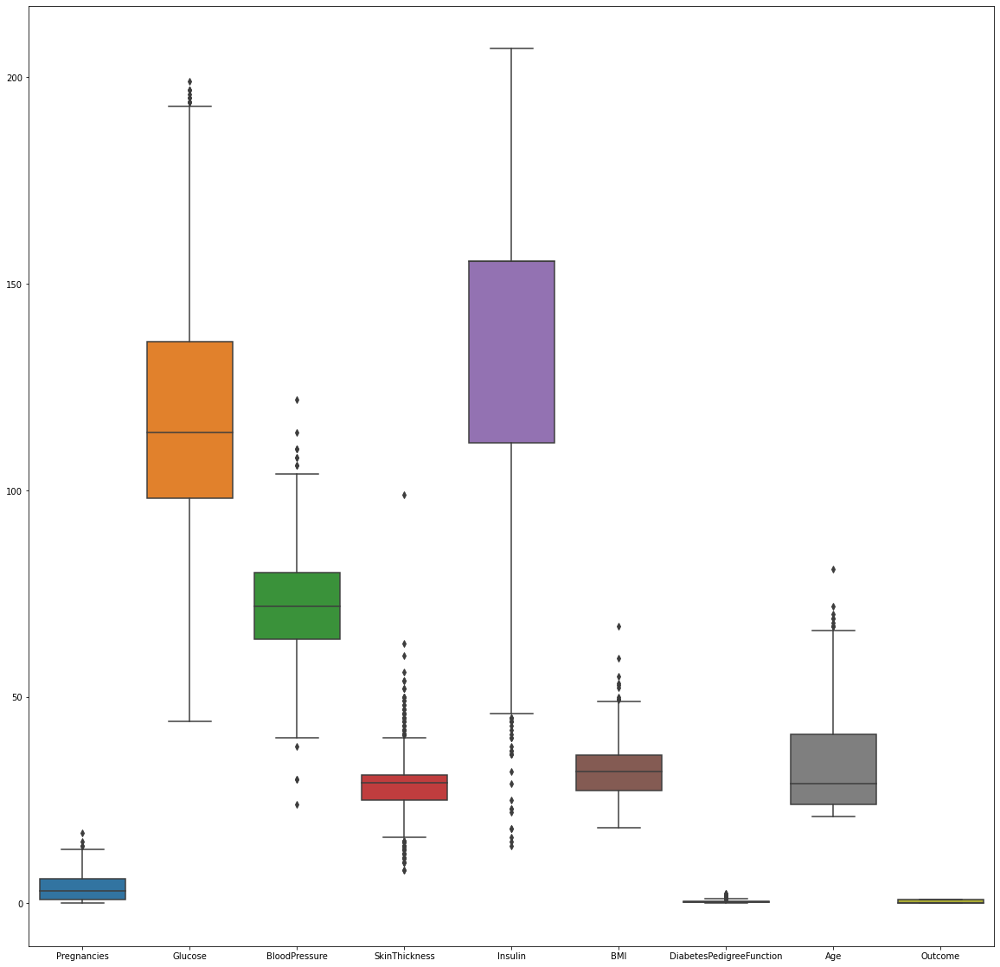

In [32]:
fig, ax= plt.subplots(figsize =(20,20))
sns.boxplot(data = df_new1, ax=ax)

In [33]:
df_new1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.00000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.00000,155.548223,36.8,0.340,27,0
765,5,121.0,72.0,23.00000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,29.15342,155.548223,30.1,0.349,47,1


In [107]:
scaler = StandardScaler()
arr= pd.DataFrame(scaler.fit_transform(df_new1))  
arr

,0,1,2,3,4,5,6,7,8
0,0.638695,1.021666,-0.014890,0.731515,0.529820,0.232497,0.520207,1.428343,1.434496
1,-0.843835,-1.150078,-0.513892,0.027324,0.529820,-0.807960,-0.341050,-0.187660,-0.697109
2,1.231707,2.228191,-0.680226,0.045330,0.529820,-1.298461,0.660629,-0.102607,1.434496
3,-0.843835,-1.012190,-0.513892,-0.676867,-0.993580,-0.585005,-0.915222,-1.038188,-0.697109
4,-1.140341,0.642473,-2.676234,0.731515,0.838018,1.644547,5.703351,-0.017555,1.434496
...,...,...,...,...,...,...,...,...,...
683,1.824719,-0.598524,0.317778,2.257262,1.135034,0.128452,-0.902740,2.534030,-0.697109
684,-0.547329,0.125391,-0.181224,-0.207406,0.529820,0.708135,-0.375376,-0.527871,-0.697109
685,0.342189,0.090919,-0.014890,-0.676867,-0.548056,-0.867415,-0.671823,-0.272713,-0.697109
686,-0.843835,0.263279,-1.012894,0.045330,0.529820,-0.287731,-0.347291,1.173185,1.434496


In [7]:
ProfileReport(arr)

NameError: name 'arr' is not defined

<AxesSubplot:>

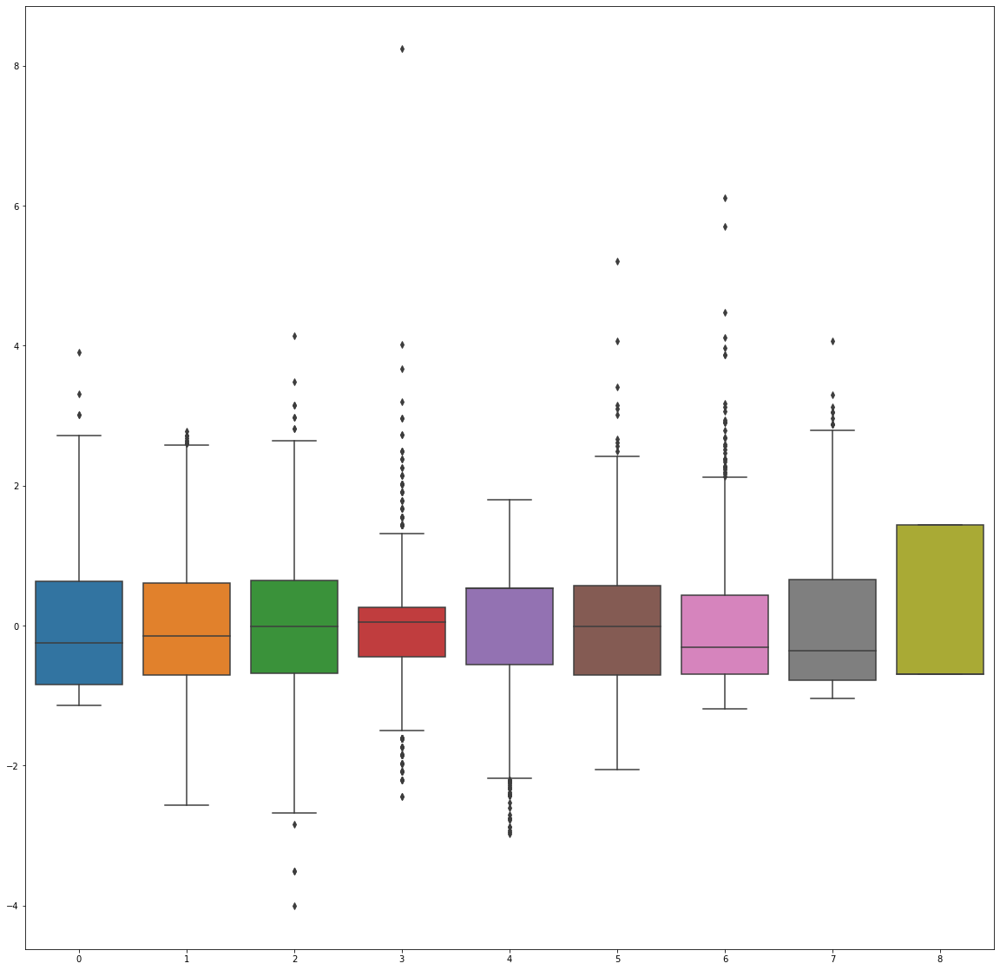

In [36]:
fig, ax= plt.subplots(figsize =(20,20))
sns.boxplot(data = arr, ax=ax)

In [62]:
for i in range(arr.shape[1]):
    print(variance_inflation_factor(arr,i))

1.4366608721055896
1.4607439381060177
1.228949294063392
1.4129835795119179
1.1776090641587311
1.5754748128304066
1.0667211170858966
1.6372221441963304
1.4841356912709363


In [63]:
arr.shape
df_new1.columns[1]

'Glucose'

In [102]:
a=[[],[]]
for i in range(arr.shape[1]):                                 #VALUES smaller than 10, so no multicollinearity
    a[0].append(df_new1.columns[i])
    a[1].append(variance_inflation_factor(arr,i))
pd.DataFrame({"F":a[0],"S":a[1]})
    #dfx
    #pd.DataFrame()

,F,S
0,Pregnancies,1.436661
1,Glucose,1.460744
2,BloodPressure,1.228949
3,SkinThickness,1.412984
4,Insulin,1.177609
5,BMI,1.575475
6,DiabetesPedigreeFunction,1.066721
7,Age,1.637222
8,Outcome,1.484136


In [103]:
df_new1.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50,1
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31,0
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32,1
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33,1


In [109]:
y= df_new1["Outcome"]
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 688, dtype: int64

In [111]:
x=df_new1.drop(columns=['Outcome'])
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.00000,155.548223,33.6,0.627,50
1,1,85.0,66.0,29.00000,155.548223,26.6,0.351,31
2,8,183.0,64.0,29.15342,155.548223,23.3,0.672,32
3,1,89.0,66.0,23.00000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.00000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.00000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.00000,155.548223,36.8,0.340,27
765,5,121.0,72.0,23.00000,112.000000,26.2,0.245,30
766,1,126.0,60.0,29.15342,155.548223,30.1,0.349,47


In [113]:
x_scaled=scaler.fit_transform(df_new1)
x_scaled

array([[ 0.63869462,  1.02166635, -0.01489045, ...,  0.52020666,
         1.42834331,  1.43449565],
       [-0.8438354 , -1.15007845, -0.51389243, ..., -0.34105027,
        -0.18766013, -0.69710912],
       [ 1.23170663,  2.22819123, -0.68022642, ...,  0.66062898,
        -0.10260732,  1.43449565],
       ...,
       [ 0.34218862,  0.09091857, -0.01489045, ..., -0.67182286,
        -0.27271294, -0.69710912],
       [-0.8438354 ,  0.26327927, -1.01289441, ..., -0.34729126,
         1.17318488,  1.43449565],
       [-0.8438354 , -0.87430134, -0.18122444, ..., -0.45338813,
        -0.86808263, -0.69710912]])

In [117]:
!seaborn version

/bin/bash: seaborn: command not found
